# Yedidya Harris @ SmartVertiCrops
# Calc the PAR factors in the Frostroom, Roof, and Farm
# Predicting PAR values in Frostroom for SUMMER 2022

## libs and functions

In [2]:
import pandas as pd
import numpy as np
import datetime as dt
import time
from datetime import datetime, date, time, timedelta
from google.colab import data_table
import matplotlib.pyplot as plt
from matplotlib import pylab
import seaborn as sns
sns.set(font_scale=1.5)
# Handle date time conversions between pandas and matplotlib
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
import matplotlib.dates as mdates
from calendar import month_abbr
from matplotlib.dates import DateFormatter
from matplotlib.pyplot import text
import plotly.express as px


In [3]:
# paths
folder_path = 'FOLDER_PATH'

In [4]:
# # dat->csv->pandas df in Python
# # useful for dealing with LoggerNet .dat files (from the DataLogger)
# # Yedidya Harris

# # importing the essential libraries
# import pandas as pd
# import subprocess
# import os
# import time
# from pathlib import Path
# import logging
# import requests
# import fnmatch, shutil

# #########Instructions#########
# # 1. Define paths to .dat file and project folder.
# # 2. Go to csv_to_df function, and edit the wanted columns in your dataframe.
# # 3. Run all.
# # 4. Have fun with your new pandas dataframe.
# ##############################


# #################DEFINE PATHS HERE, and then RUN ALL#################
# # global vars
# data_folder_path = folder_path # path to your project folder (where the csv is going to be saved)
# file_dat_source = "/content/drive/Othercomputers/My Laptop/Files/lab/smart_verticrops/experiments/cultivar testing/par_ana/cr1000_frostroom_Min10.dat" # direct path to original .dat file 
# ######################################################################

# # dat to csv conversion
# def downloadCsv(file_dat_source):

#     t = time.localtime()
#     timestamp = time.strftime('%b-%d-%Y_%H%M', t)
    

#     #url = 'link' # link to the *.dat file  - UNCOMMENT IF YOU WANT TO DOWNLOAD FROM URL
#     #r = requests.get(url, allow_redirects=True) - UNCOMMENT IF YOU WANT TO DOWNLOAD FROM URL
    
    
#     file_dat = f'{data_folder_path}/{timestamp}.dat'
#     file_csv = f'{data_folder_path}/{timestamp}.csv'
#     latest_csv = f'{data_folder_path}/latest.csv'
#     shutil.copyfile(file_dat_source, file_dat) # making a copy of the latest dat (source)
    
#     #open(file_dat, 'wb').write(r.content) # download source *.dat file from url to local - UNCOMMENT IF YOU WANT TO DOWNLOAD FROM URL

#     # converting dat to csv
#     with open(file_dat) as f:
#         with open(file_csv, "w") as f1:
#             next(f) # skip false header line
#             for line in f:
#                 f1.write(line)

#     shutil.copyfile(file_csv, latest_csv) # making a copy of the latest csv
       
#     # remove temp dat+ csv files, leaving only latest.csv
#     if os.path.exists(file_dat):
#       os.remove(file_dat)
#     if os.path.exists(file_csv):
#       os.remove(file_csv)
   
# # csv to pandas df conversion
# def csv_to_df(data_folder_path):
#   df = pd.read_csv(f'{data_folder_path}/latest.csv', parse_dates=['TIMESTAMP'], low_memory=False) #

#   # convert columns to numeric values
#   for col in df.columns:
#     if col != "TIMESTAMP": 
#       df[col] = df[col].astype(float, errors = 'ignore') 
#       df.dropna(subset = [col], inplace=True)

#   # df['Par_Avg'] = df['Par_Avg'].astype(float, errors = 'ignore') # convert columns to numeric values
#   # df.dropna(subset = ['Par_Avg'], inplace=True)
  
#   df = df[['TIMESTAMP','Par_Avg', 'PAR500_Avg', 'PAR512_Avg']] # choose your wanted columns from your df
#   df = df.iloc[3:] #take the data, starting from the 3rd row (in your dat file, you may need a different start row)
#   df['TIMESTAMP'] = pd.to_datetime(df['TIMESTAMP']) # convert timestamp column to datetime object type
#   return df

# ##########CALLING THE FUNCTIONS##########
# # calling the functions to convert dat->csv->pandas df
# downloadCsv(file_dat_source) #don't forget to define paths at top
# my_df = csv_to_df(data_folder_path) # your dataframe object
# #########################################

In [5]:
# function to clean the df
def clean_df (folder_path, csv_file_name, col_name):  

  #read csv file
  df = pd.read_csv(f'{folder_path}/{csv_file_name}.csv')

  #create new df
  df_updated = pd.DataFrame()
  df_updated['TIMESTAMP'] = df["TIMESTAMP"]
  try:
    df_updated['TIMESTAMP'] = pd.to_datetime(df_updated['TIMESTAMP'], format='%d/%m/%Y %H:%M') 
  except ValueError: # if the format of the datetime is the opposite
    df_updated['TIMESTAMP'] = pd.to_datetime(df_updated['TIMESTAMP'], format='%m/%d/%Y %H:%M') 

  df_updated[col_name] = df[col_name]
  df_updated[col_name] = df_updated[col_name].astype(float, errors = 'raise') #convert the col to float
  
  # remove empty rows
  nan_value = float("NaN") # temp var
  df_updated.replace("", nan_value, inplace=True) # Convert empty rows to NaN values
  df_updated.dropna(subset = [col_name], inplace=True)

  # set index and sort by date
  df_updated=df_updated.set_index('TIMESTAMP')
  df_updated = df_updated.sort_values(by="TIMESTAMP")

  return df_updated

In [6]:
def quick_view(df, col_name):
  # taking a look at the data

  sns.set_theme(style="whitegrid",font_scale = 2)
  fig, ax = plt.subplots(1, figsize=(20,7.5))
  ax.plot(df[col_name], linewidth=2)
  ax.set(xlabel=" ",
        ylabel=col_name,
        title=col_name);
  plt.legend(loc='best')
  plt.gcf().autofmt_xdate()  # makes slated dates
  plt.tight_layout()

In [7]:
# function that takes: df, start date, end date, col name and returns a new df between the given dates
def select_dates_df(df, start_date, end_date, col_name):
  mask = (df.index > start_date) & (df.index <= end_date)
  df_filtered = df.loc[mask]
  df_filtered.dropna(subset = [col_name], inplace=True) # drop NaN values that were created because of the filter

  return df_filtered

In [8]:
# function to plot a graph in polotly

import plotly.graph_objects as go
def plot_df (latest_df, col_x, col_y1, col_y2='none', trace1_name='none', trace2_name='none', x_title='', y_title='', plot_title=''):

  # Create figure
  fig = go.Figure()

  if col_y2 == 'none':   
      fig.add_trace(
          go.Scatter(x=list(latest_df[col_x]), y=list(latest_df[col_y1]),        
          
          hovertemplate="%{y}%{_xother}"
           ))

  if col_y2 != 'none':   
      fig.add_trace(
          go.Scatter(
              x=list(latest_df[col_x]), y=list(latest_df[col_y1]),
              name=trace1_name, hovertemplate="%{y}%{_xother}"      
          ))
      
      fig.add_trace(
          go.Scatter(
              x=list(latest_df[col_x]), y=list(latest_df[col_y2]),
              name=trace2_name, hovertemplate="%{y}%{_xother}"     
          ))

  # Set title
  fig.update_layout(
      xaxis_title=x_title,
      yaxis_title=y_title,

      height=600, width=1500,
      title={
      'text': plot_title,
      'y':0.9,
      'x':0.5,
      'xanchor': 'center',
      'yanchor': 'top'}
  )      
  

  # Add range slider
  fig.update_layout(
      xaxis=dict(
          rangeselector=dict(
              buttons=list([
                  dict(count=1,
                      label="1minute  ",
                      step="minute",
                      stepmode="backward"),            
                  dict(count=1,
                      label="1hour",
                      step="hour",
                      stepmode="backward"),       
                  dict(count=1,
                      label="1day",
                      step="day",
                      stepmode="backward"),                 
                  dict(count=1,
                      label="1month",
                      step="month",
                      stepmode="backward"),
                  dict(count=6,
                      label="6months",
                      step="month",
                      stepmode="backward"),
                  dict(step="all")
              ])
          ),
          rangeslider=dict(
              visible=True
          ),
          type="date"
      )
  )

  fig.update_layout(hovermode="x unified")

  return fig    

In [167]:
# function to plot with plotly a trendline of mean + filling of a std (1 trendline)

def plot_with_std(df, x, y, std, name_of_trendline, y_title, graph_title):
  fig = go.Figure([
    go.Scatter(
        name=name_of_trendline,
        x=df[x],
        y=df[y],
        mode='lines',
        line=dict(color='rgb(31, 119, 180)'),
    ),
    go.Scatter(
        name='Upper Bound',
        x=df[x],
        y=df[y]+df_farm_summer[std],
        mode='lines',
        marker=dict(color="#444"),
        line=dict(width=0),
        showlegend=False
    ),
    go.Scatter(
        name='Lower Bound',
        x=df[x],
        y=df[y]-df[std],
        marker=dict(color="#444"),
        line=dict(width=0),
        mode='lines',
        fillcolor='rgba(68, 68, 68, 0.3)',
        fill='tonexty',
        showlegend=False
    )
  ])

  fig.update_layout(
      yaxis_title=y_title,
      title=graph_title,
      hovermode="x"
  )

    # Add range slider
  fig.update_layout(
      xaxis=dict(
          rangeselector=dict(
              buttons=list([
                  dict(count=1,
                      label="1minute  ",
                      step="minute",
                      stepmode="backward"),            
                  dict(count=1,
                      label="1hour",
                      step="hour",
                      stepmode="backward"),       
                  dict(count=1,
                      label="1day",
                      step="day",
                      stepmode="backward"),                 
                  dict(count=1,
                      label="1month",
                      step="month",
                      stepmode="backward"),
                  dict(count=6,
                      label="6months",
                      step="month",
                      stepmode="backward"),
                  dict(step="all")
              ])
          ),
          rangeslider=dict(
              visible=True
          ),
          type="date"
      )
  )
  return fig

## Reading and cleaning our csvs

In [9]:
# loading and cleaning
df_room7 = clean_df(folder_path, 'room7', 'par_room7')
df_room7_dl = clean_df(folder_path, 'room7_dl', 'par_room7')
df_room8 = clean_df(folder_path, 'room8', 'par_room8')
df_room8_dl = clean_df(folder_path, 'room8_dl', 'par_room8')
df_roof = clean_df(folder_path, 'lab_roof', 'par_roof')
df_farm = clean_df(folder_path, 'rad_farm', 'Rad')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: DtypeWarning: Columns (1) have mixed types.Specify dtype option on import or set low_memory=False.
  


In [10]:
# connecting the frostroom data from datalogger and wemos (I made sure there are no duplicates manually in excel)
df_room7_new = pd.concat([df_room7_dl,df_room7])
df_room8_new = pd.concat([df_room8_dl,df_room8])


In [11]:
# more cleaning

# df in the frostroom - removing values higher than 1300
df_room7_new.drop(df_room7_new[df_room7_new['par_room7'] > 1300].index, inplace = True)
df_room8_new.drop(df_room8_new[df_room8_new['par_room8'] > 1300].index, inplace = True)
df_farm.drop(df_farm[df_farm['Rad'] > 1100].index, inplace = True)

#convert negative values to 0 (offset of the par sensors)
df_room7_new[df_room7_new < 0] = 0
df_room8_new[df_room8_new < 0] = 0
df_roof[df_roof < 0] = 0

# converting units of Radiation on farm from W/m^2 to  µmol m-2 -s (1 Wm-2 is 4.6 µmol m-2 -s)
# source https://www.skyeinstruments.com/unit-calculator/
df_farm['rad_farm'] = df_farm['Rad']*4.6

## Quick view at our graphs

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


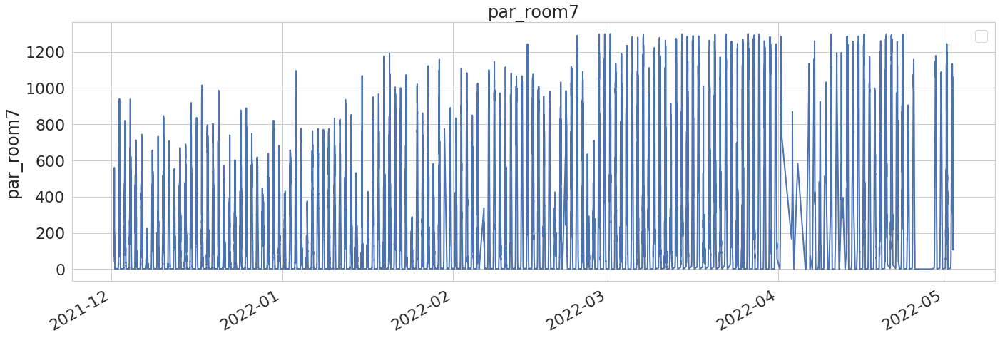

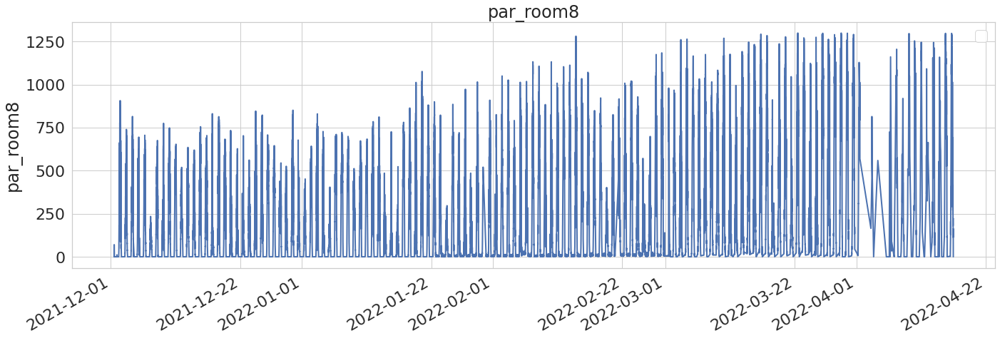

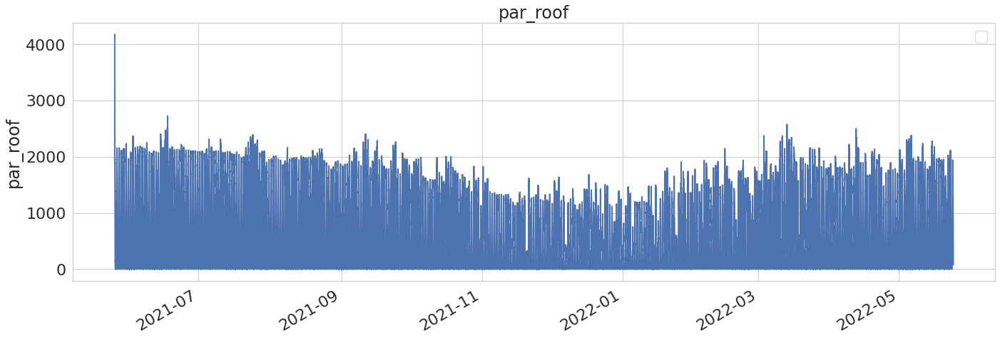

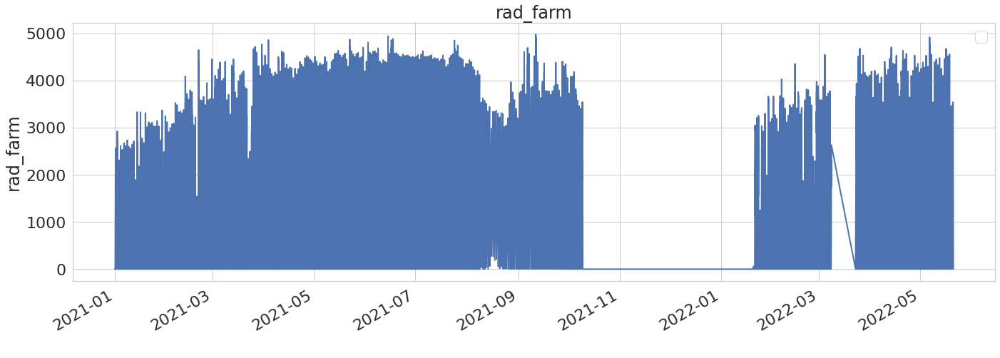

In [12]:
# quick view at our graphs
quick_view(df_room7_new, 'par_room7')
quick_view(df_room8_new, 'par_room8')
quick_view(df_roof, 'par_roof')
quick_view(df_farm, 'rad_farm')

## Resampling to 10 min

In [13]:
# resampling by 10 min
df_room7_resampled = df_room7_new.resample('10min').mean()
df_room8_resampled = df_room8_new.resample('10min').mean()
df_roof_resampled = df_roof.resample('10min').mean()
df_farm_resampled = df_farm.resample('10min').mean()

## Slicing by date (by the dates of the frostroom data)

In [14]:
# selecting relevant dates

# dates with values from the frostroom
start_date = '2021-12-01'
end_date   = '2022-04-21'

df_room7_dates = select_dates_df(df_room7_resampled, start_date, end_date, 'par_room7') 
df_room8_dates = select_dates_df(df_room8_resampled, start_date, end_date, 'par_room8') 
df_roof_dates = select_dates_df(df_roof_resampled, start_date, end_date, 'par_roof') 
df_farm_dates = select_dates_df(df_farm_resampled, start_date, end_date, 'rad_farm') 


/usr/local/lib/python3.7/dist-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


## Quick view at our graphs

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


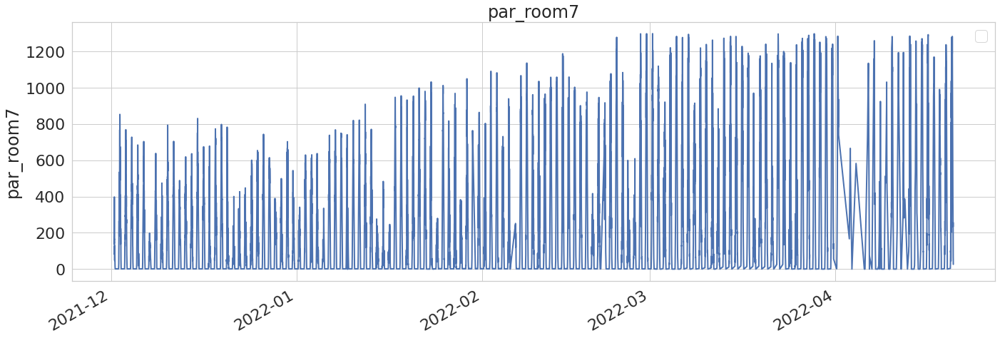

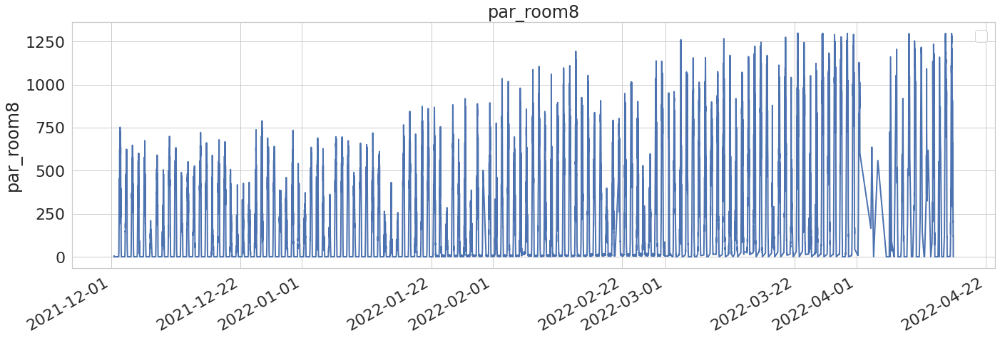

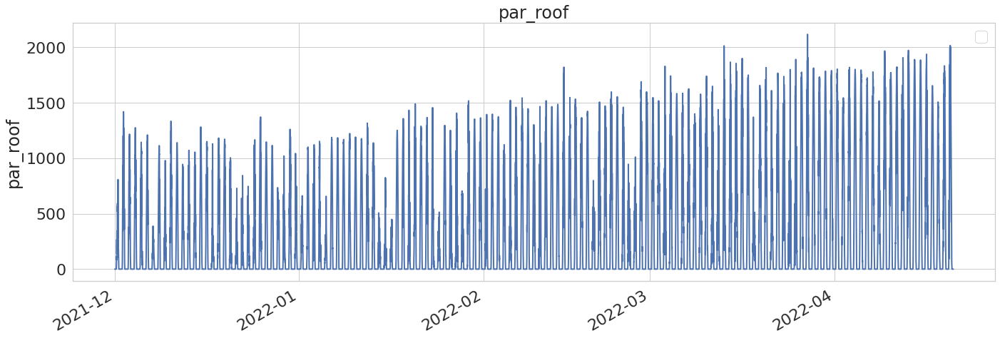

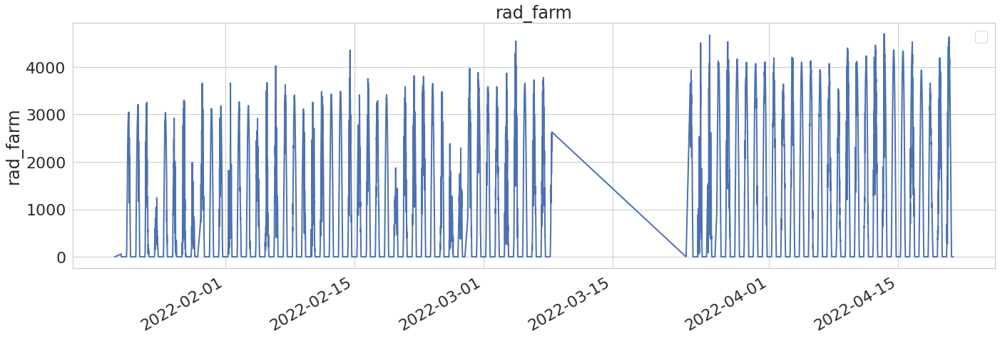

In [15]:
# quick view at our graphs
quick_view(df_room7_dates, 'par_room7')
quick_view(df_room8_dates, 'par_room8')
quick_view(df_roof_dates, 'par_roof')
quick_view(df_farm_dates, 'rad_farm')

## Merging the data to one df

In [16]:
# creating a new df with all above merged between the selected dates
df_merged = pd.DataFrame()
df_merged.index = df_room7_dates.index
df_merged['par_room7'] = df_room7_dates['par_room7']
df_merged['par_room8'] = df_room8_dates['par_room8']
df_merged['par_roof'] = df_roof_dates['par_roof']
df_merged['rad_farm'] = df_farm_dates['rad_farm']

# for col in df_merged.columns: # drop NaN values that were created because of the merge
#   df_merged.dropna(subset = [col], inplace=True) 


# calc the factors

# all / farm  
df_merged['roof/farm'] = df_merged['par_roof'] / df_merged['rad_farm'] # roof / farm (outside/outside)
df_merged['room7/farm'] = df_merged['par_room7'] / df_merged['rad_farm'] # (inside/outside)
df_merged['room8/farm'] = df_merged['par_room8'] / df_merged['rad_farm'] # (inside/outside)

# rooms / roof (inside/outside)
df_merged['room7/roof'] = df_merged['par_room7'] / df_merged['par_roof']
df_merged['room8/roof'] = df_merged['par_room8'] / df_merged['par_roof']

# convert inf values to 1 assuming that it's because the value that is devided by is zero
df_merged.replace(np.inf, 1, inplace=True) # drop inf values
df_merged.replace(-np.inf, 1, inplace=True) # drop inf values



#df_merged


## Quick view at the factors graphed and some more cleaning

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


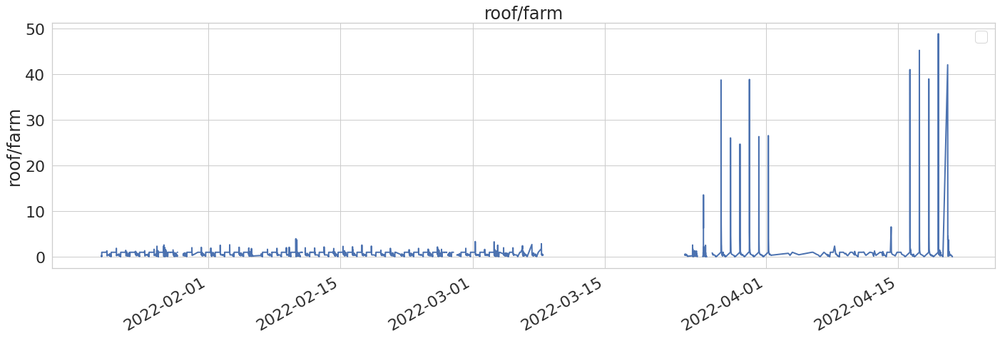

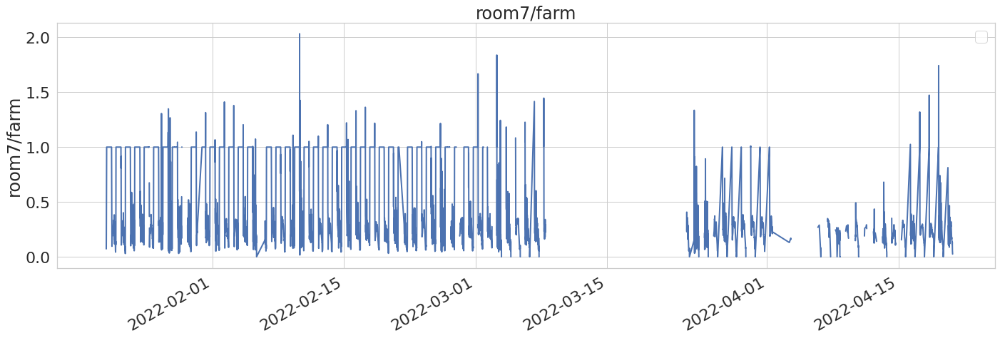

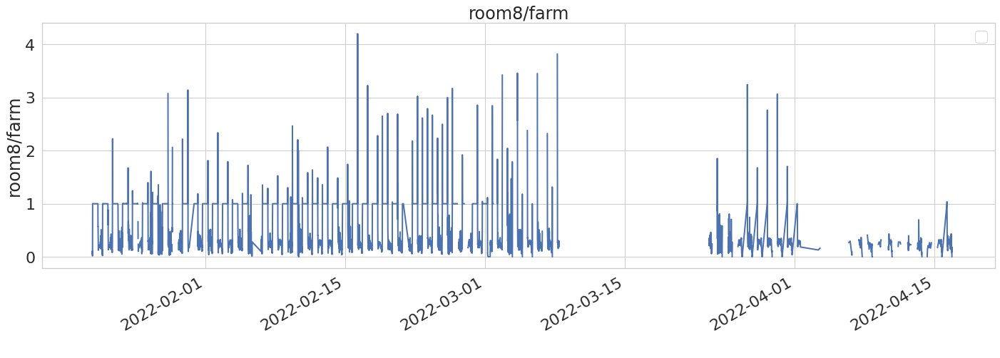

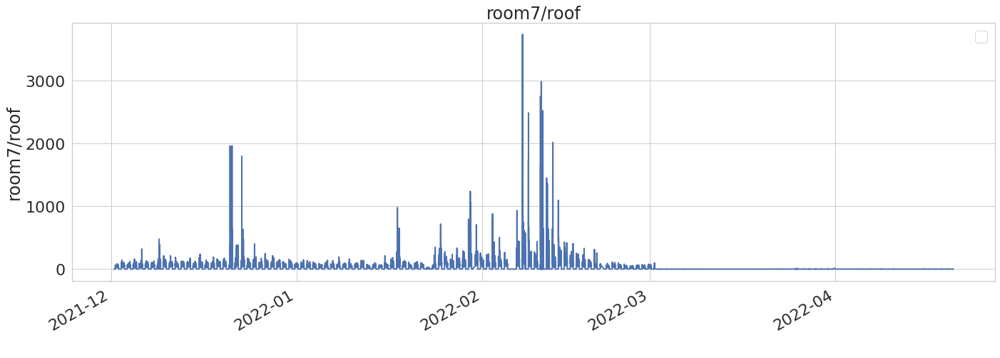

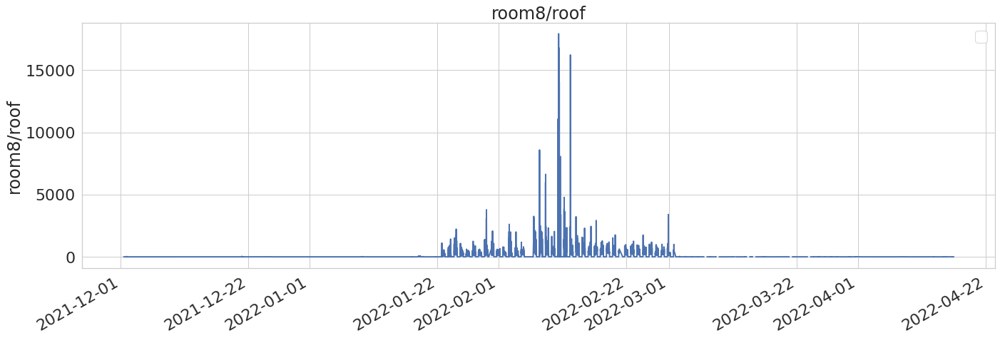

In [17]:
# quick view at our graphs
quick_view(df_merged, 'roof/farm')
quick_view(df_merged, 'room7/farm')
quick_view(df_merged, 'room8/farm')
quick_view(df_merged, 'room7/roof')
quick_view(df_merged, 'room8/roof')

In [18]:
# more cleaning

# remove high factors
df_merged.drop(df_merged[df_merged['room7/farm'] > 1].index, inplace = True)
df_merged.drop(df_merged[df_merged['room8/farm'] > 1].index, inplace = True)
df_merged.drop(df_merged[df_merged['room7/roof'] > 1].index, inplace = True)
df_merged.drop(df_merged[df_merged['room8/roof'] > 1].index, inplace = True)
df_merged.drop(df_merged[df_merged['roof/farm'] > 1].index, inplace = True)

In [19]:
# resampling hourly and daily
df_merged_resampled_1hour = df_merged.resample('60min').mean()
df_merged_resampled_daily = df_merged.resample('24H').mean()

# adding timestamp col for plotly
df_merged['TIMESTAMP'] = df_merged.index
df_merged_resampled_1hour['TIMESTAMP'] = df_merged_resampled_1hour.index
df_merged_resampled_daily['TIMESTAMP'] = df_merged_resampled_daily.index


## Plottling with plotly (10 min)

In [20]:
plot_df (df_merged, 'TIMESTAMP', 'room7/farm', 'room8/farm', 'Room 7', 'Room 8', 'TIMESTAMP', 'PAR_Room / RADIATION_Farm', 'PAR_Room / RADIATION_Farm factor for Frostroom')

In [21]:
plot_df (df_merged, 'TIMESTAMP', 'room7/roof', 'room8/roof', 'Room 7 / Roof', 'Room 8 / Roof', 'TIMESTAMP', 'PAR_Room / PAR_Roof', 'PAR_Room / PAR_Roof factor for Frostroom')

In [22]:
plot_df (df_merged, 'TIMESTAMP', 'roof/farm', 'none', 'Roof / Farm', 'none', 'TIMESTAMP', 'PAR_Roof / RADIATION_farm', 'PAR_Roof / RADIATION_farm factor')

In [23]:
df_merged

,par_room7,par_room8,par_roof,rad_farm,roof/farm,room7/farm,room8/farm,room7/roof,room8/roof,TIMESTAMP
TIMESTAMP,,,,,,,,,,
2021-12-01 12:10:00,137.453533,0.000000,316.90,NaN,NaN,NaN,NaN,0.433744,0.000000,2021-12-01 12:10:00
2021-12-01 12:20:00,181.020085,0.000000,351.74,NaN,NaN,NaN,NaN,0.514642,0.000000,2021-12-01 12:20:00
2021-12-01 12:30:00,153.613455,4.660757,307.86,NaN,NaN,NaN,NaN,0.498972,0.015139,2021-12-01 12:30:00
2021-12-01 12:40:00,147.932255,0.000000,289.29,NaN,NaN,NaN,NaN,0.511363,0.000000,2021-12-01 12:40:00
2021-12-01 12:50:00,142.388050,3.523774,276.76,NaN,NaN,NaN,NaN,0.514482,0.012732,2021-12-01 12:50:00
...,...,...,...,...,...,...,...,...,...,...
2022-04-20 16:10:00,431.028000,NaN,693.60,2801.4,0.247590,0.153862,NaN,0.621436,NaN,2022-04-20 16:10:00
2022-04-20 16:20:00,376.043000,NaN,643.78,2649.6,0.242973,0.141924,NaN,0.584117,NaN,2022-04-20 16:20:00
2022-04-20 16:30:00,323.540500,NaN,571.44,2511.6,0.227520,0.128818,NaN,0.566185,NaN,2022-04-20 16:30:00


## Plottling with plotly (hourly)

In [24]:
hourly1 = plot_df (df_merged_resampled_1hour, 'TIMESTAMP', 'room7/farm', 'room8/farm', 'Room 7', 'Room 8', 'TIMESTAMP', 'PAR_Room / RADIATION_Farm', 'PAR_Room / RADIATION_Farm factor for Frostroom')
hourly1

In [25]:
hourly2 = plot_df (df_merged_resampled_1hour, 'TIMESTAMP', 'room7/roof', 'room8/roof', 'Room 7 / Roof', 'Room 8 / Roof', 'TIMESTAMP', 'PAR_Room / PAR_Roof', 'PAR_Room / PAR_Roof factor for Frostroom')
hourly2

In [26]:
hourly3 = plot_df (df_merged_resampled_1hour, 'TIMESTAMP', 'roof/farm', 'none', 'Roof / Farm', 'none', 'TIMESTAMP', 'PAR_Roof / RADIATION_farm', 'PAR_Roof / RADIATION_farm factor')
hourly3

## Plottling with plotly (daily)

In [27]:
daily1 = plot_df (df_merged_resampled_daily, 'TIMESTAMP', 'room7/farm', 'room8/farm', 'Room 7', 'Room 8', 'TIMESTAMP', 'PAR_Room / RADIATION_Farm', 'PAR_Room / RADIATION_Farm factor for Frostroom')
daily1

In [28]:
daily2 = plot_df (df_merged_resampled_daily, 'TIMESTAMP', 'room7/roof', 'room8/roof', 'Room 7 / Roof', 'Room 8 / Roof', 'TIMESTAMP', 'PAR_Room / PAR_Roof', 'PAR_Room / PAR_Roof factor for Frostroom')

In [29]:
daily3 = plot_df (df_merged_resampled_daily, 'TIMESTAMP', 'roof/farm', 'none', 'Roof / Farm', 'none', 'TIMESTAMP', 'PAR_Roof / RADIATION_farm', 'PAR_Roof / RADIATION_farm factor')

## Predicting PAR values in Room 7 for Summer 2022

### Using the FARM DATA

In [199]:
# slicing summer 2021 from the farm (radiation)
# selecting relevant dates

# dates with values from the frostroom
start_date = '2021-06-01'
end_date   = '2021-11-01'

df_farm_summer = select_dates_df(df_farm_resampled, start_date, end_date, 'rad_farm') 

/usr/local/lib/python3.7/dist-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



No handles with labels found to put in legend.


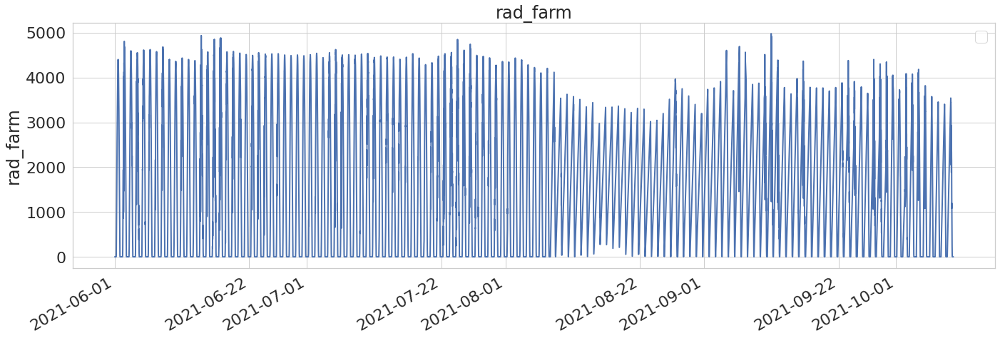

In [200]:
quick_view(df_farm_summer, 'rad_farm')

In [201]:
# calc the factor of room7 par \ farm radiation (from above data)
room7_factor = df_merged_resampled_daily['room7/farm'].mean()
room7_factor_std = df_merged_resampled_daily['room7/farm'].std()
print(room7_factor)
print(room7_factor_std)

0.2364042484137965
0.054951274697169004


In [202]:
# future par values in room7 during summer 2022

# if par_room_2021/rad_farm_2021 = 0.2364
# then par_room_2022=0.2364*rad_farm_2022

df_farm_summer['par_room7_2022'] = df_farm_summer['rad_farm']*room7_factor
df_farm_summer['std'] = df_farm_summer['rad_farm']*room7_factor_std


# adding a timestamp for 2022
df_farm_summer['TIMESTAMP_2022'] = df_farm_summer.index
df_farm_summer['TIMESTAMP_2022'] = df_farm_summer['TIMESTAMP_2022'] + pd.Timedelta(days = 365)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

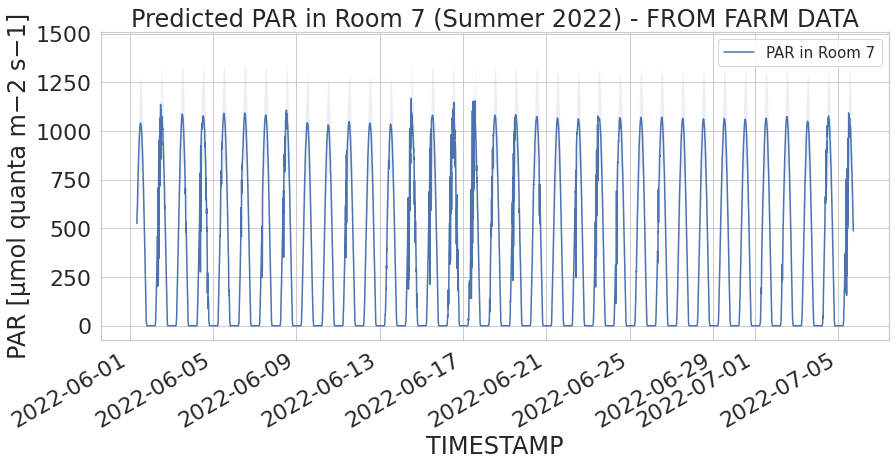

In [203]:
df_farm_summer_graph=df_farm_summer[50:5000]

# creates figure (the canvas) and the axis (rectangle where the plot sits)
fig, ax = plt.subplots(1, figsize=(13,7))

# plots (one col is the mean, one is the std)
ax.fill_between(df_farm_summer_graph['TIMESTAMP_2022'], df_farm_summer_graph['par_room7_2022'] + df_farm_summer_graph['std'], df_farm_summer_graph['par_room7_2022']-df_farm_summer_graph['std'], alpha=.1)
ax.plot(df_farm_summer_graph['TIMESTAMP_2022'], df_farm_summer_graph['par_room7_2022'], label="PAR in Room 7")

# axes labels and figure title
ax.set_xlabel('TIMESTAMP')
ax.set_ylabel('PAR [μmol quanta m−2 s−1]')
ax.set_title('Predicted PAR in Room 7 (Summer 2022) - FROM FARM DATA')


# legend
ax.legend(loc='best',fontsize = 15)
plt.gcf().autofmt_xdate()  # makes slated dates
plt.tight_layout()


In [204]:
fig_par_room7_from_farm =  plot_with_std(df_farm_summer, 'TIMESTAMP_2022', 'par_room7_2022', 'std', 'Predicted PAR', 'PAR [μmol quanta m−2 s−1]', 'Predicted PAR in Room 7 (Summer 2022) - FROM FARM DATA')  

### Using the ROOF DATA

In [205]:
# slicing summer 2021 from the Roof (radiation)
# selecting relevant dates

# dates with values from the frostroom
start_date = '2021-06-01'
end_date   = '2021-11-01'

df_roof_summer = select_dates_df(df_roof_resampled, start_date, end_date, 'par_roof') 

/usr/local/lib/python3.7/dist-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



No handles with labels found to put in legend.


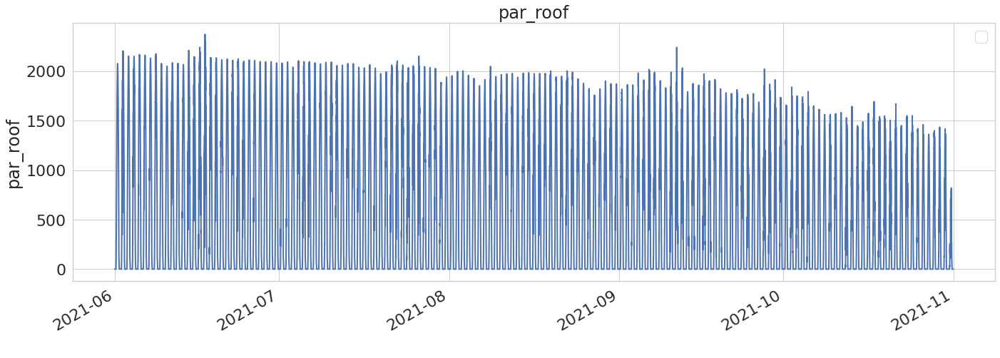

In [206]:
quick_view(df_roof_summer, 'par_roof')

In [207]:
# calc the factor of room7 par \ farm radiation (from above data)
room7_factor_roof = df_merged_resampled_daily['room7/roof'].agg('mean')
room7_factor_roof_std = df_merged_resampled_daily['room7/roof'].std()
print(room7_factor_roof)
print(room7_factor_roof_std)

0.5067739222741438
0.09151426848603557


In [208]:
# future par values in room7 during summer 2022

# if par_room_2021/rad_farm_2021 = 0.2364
# then par_room_2022=0.2364*rad_farm_2022

df_roof_summer['par_room7_2022'] = df_roof_summer['par_roof']*room7_factor_roof
df_roof_summer['std'] = df_roof_summer['par_roof']*room7_factor_roof_std

# adding a timestamp for 2022
df_roof_summer['TIMESTAMP_2022'] = df_roof_summer.index
df_roof_summer['TIMESTAMP_2022'] = df_roof_summer['TIMESTAMP_2022'] + pd.Timedelta(days = 365)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

In [209]:
fig_par_room7_from_roof = plot_with_std(df_roof_summer, 'TIMESTAMP_2022', 'par_room7_2022', 'std', 'Predicted PAR', 'PAR [μmol quanta m−2 s−1]', 'Predicted PAR in Room 7 (Summer 2022) - FROM ROOF DATA')  

### Comparing the two

In [210]:
df_summer2022 = pd.DataFrame()
df_summer2022['TIMESTAMP']=df_roof_summer['TIMESTAMP_2022']
df_summer2022['par_room7_from_roof']=df_roof_summer['par_room7_2022']
df_summer2022['par_room7_from_farm']=df_farm_summer['par_room7_2022']

In [211]:
fig_par_room7_from_roof_and_farm  = plot_df (df_summer2022, 'TIMESTAMP', 'par_room7_from_roof', 'par_room7_from_farm', 'Room 7 / Roof', 'Room 7 / Farm', 'TIMESTAMP', 'PAR [μmol quanta m−2 s−1]', 'Predicted PAR in Room 7 (Summer 2022)')

### Displaying the graphs

In [212]:
fig_par_room7_from_farm

In [213]:
fig_par_room7_from_roof

In [214]:
fig_par_room7_from_roof_and_farm

### Calc total energy of an average day in the summer and comparing to artificial light in lab

In [107]:
# slicing a week from aug 2022

# dates with values from the frostroom
start_date = '2021-08-01'
end_date   = '2021-08-07'

df_aug = select_dates_df(df_farm_summer, start_date, end_date, 'par_room7_2022') # selecting 7 days in aug
df_aug['TIMESTAMP'] =df_aug.index
array_aug = df_aug['par_room7_2022'].to_numpy() # converting only the par in room to numpy array

# calc the integral
integral = np.trapz(array_aug, dx=np.diff(df_aug['TIMESTAMP']))/7   #calc the integral, with dx as 10 minutes, because it is resampled every 10 minutes, then deviding by 7, for daily
integral = integral.astype(int) / 1e9 # convert ns to s
integral_energy = integral*0.2173913043478261 #convert to Wm-2 or [J*S*m-2] (source: https://www.skyeinstruments.com/unit-calculator/)
integral_energy = integral_energy / 1e6 # to convert to [MJ*S*m-2]

energy_tomato_lab = 460* 0.2173913043478261  * 16*60*60 / 1e6 # energy in tomato wall in lab: 460 [μmol quanta m−2 s−1] * 0.21 [factor] * 16 [hours] * 60 [minutes] * 60 [seconds] / 1e6 [to MJ]

#comparing the total energy in frostroom for future exp, and the energy the tomatoes get in the lab
print(f'Daily energy in the lab: {"{:.2f}".format(energy_tomato_lab)} [MJ*S*m-2]')
print(f'Daily energy in the frostroom: {"{:.2f}".format(integral_energy)} [MJ*S*m-2]')

Daily energy in the lab: 5.76 [MJ*S*m-2]
Daily energy in the frostroom: 5.32 [MJ*S*m-2]


/usr/local/lib/python3.7/dist-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



No handles with labels found to put in legend.


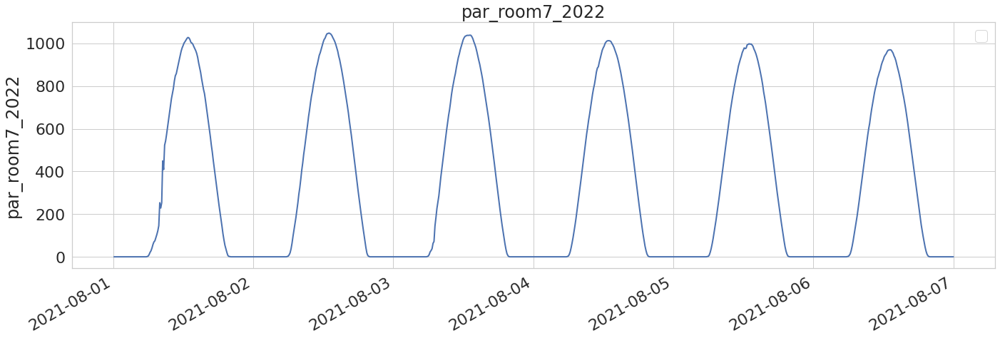

In [95]:
quick_view(df_aug, 'par_room7_2022')

## Final saves

In [215]:
# saving the plotly figures to html and merged dfs to csvs

with open(f'{folder_path}/home.html', 'a') as f:
    f.write(hourly1.to_html(full_html=False, include_plotlyjs='cdn'))
    f.write(hourly2.to_html(full_html=False, include_plotlyjs='cdn'))
    f.write(hourly3.to_html(full_html=False, include_plotlyjs='cdn'))
    f.write(daily1.to_html(full_html=False, include_plotlyjs='cdn'))
    f.write(daily2.to_html(full_html=False, include_plotlyjs='cdn'))
    f.write(daily3.to_html(full_html=False, include_plotlyjs='cdn'))
    f.write(fig_par_room7_from_farm.to_html(full_html=False, include_plotlyjs='cdn'))
    f.write(fig_par_room7_from_roof.to_html(full_html=False, include_plotlyjs='cdn'))
    f.write(fig_par_room7_from_roof_and_farm.to_html(full_html=False, include_plotlyjs='cdn'))


# # saving dfs to csv
# df_merged_resampled_daily.to_csv(f'{folder_path}/saved_csvs/merged_daily.csv')  
# df_merged_resampled_1hour.to_csv(f'{folder_path}/saved_csvs/merged_hourly.csv')  
# df_merged.to_csv(f'{folder_path}/saved_csvs/merged_10min.csv')  